# Endometriosis - Clustering
# Cells - all datasets

In [2]:
import numpy as np
import pandas as pd
import scanpy as sc
import anndata
import os
import sys

def MovePlots(plotpattern, subplotdir):
    os.system('mkdir -p '+str(sc.settings.figdir)+'/'+subplotdir)
    os.system('mv '+str(sc.settings.figdir)+'/*'+plotpattern+'** '+str(sc.settings.figdir)+'/'+subplotdir)

sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.figdir = './figures/cells/main/'
sc.settings.set_figure_params(dpi=80)  # low dpi (dots per inch) yields small inline figures

sys.executable

'/home/jovyan/my-conda-envs/sc_analysis/bin/python'

## Load data

In [3]:
path2datas = '/nfs/team292/lg18/endometriosis/integrated_objects/'
adata = sc.read(path2datas+'cells_integrated.h5ad')
adata.X.shape

(390867, 17736)

## Add sample metadata

In [4]:
meta_sample = pd.read_csv('metadata-libraries_deconvoluted.csv',index_col=1)
meta_sample


annot = meta_sample['Biopsy_type'].to_dict()
adata.obs['Biopsy_type'] = adata.obs.Library_genotype.map(annot)
print(adata.obs['Biopsy_type'].value_counts())

annot = meta_sample['Tissue_sampled'].to_dict()
adata.obs['Tissue_sampled'] = adata.obs.Library_genotype.map(annot)
print(adata.obs['Tissue_sampled'].value_counts())

annot = meta_sample['Group'].to_dict()
adata.obs['Group'] = adata.obs.Library_genotype.map(annot)
print(adata.obs['Group'].value_counts())

annot = meta_sample['Spatial_location'].to_dict()
adata.obs['Spatial_location'] = adata.obs.Library_genotype.map(annot)
print(adata.obs['Spatial_location'].value_counts())

annot = meta_sample['Ectopic_group'].to_dict()
adata.obs['Ectopic_group'] = adata.obs.Library_genotype.map(annot)
print(adata.obs['Ectopic_group'].value_counts())

annot = meta_sample['BiopsyType_old'].to_dict()
adata.obs['BiopsyType_old'] = adata.obs.Library_genotype.map(annot)
print(adata.obs['BiopsyType_old'].value_counts())

annot = meta_sample['Tissue'].to_dict()
adata.obs['Tissue'] = adata.obs.Library_genotype.map(annot)
print(adata.obs['Tissue'].value_counts())

annot = meta_sample['Treatment'].to_dict()
adata.obs['Treatment'] = adata.obs.Library_genotype.map(annot)
print(adata.obs['Treatment'].value_counts())

annot = meta_sample['10x kit'].to_dict()
adata.obs['10x kit'] = adata.obs.Library_genotype.map(annot)
print(adata.obs['10x kit'].value_counts())


annot = meta_sample['Processing'].to_dict()
adata.obs['Processing'] = adata.obs.Library_genotype.map(annot)
print(adata.obs['Processing'].value_counts())

Superficial_Eutopic    358421
Whole_Uterus            32446
Name: Biopsy_type, dtype: int64
eutopic_endometrium    390867
Name: Tissue_sampled, dtype: int64
Ctrl_Superficial     181254
Endo_Superficial     177167
Ctrl_whole_uterus     32446
Name: Group, dtype: int64
Series([], Name: Spatial_location, dtype: int64)
Series([], Name: Ectopic_group, dtype: int64)
Superficial            345134
Organ_Donor             32446
Control_Endometrium     13287
Name: BiopsyType_old, dtype: int64
None         284446
EN_enrich     32446
EN            29811
Name: Tissue, dtype: int64
Collagenase         162542
Coll.+Trypsin       110059
ColdDig_LiveSort     44164
Trypsin              31004
Unknown              13287
Name: Treatment, dtype: int64
3' v3.1    170436
3' v3.2     90587
3' v3       44164
3' v3.0     42582
3'          29811
Name: 10x kit, dtype: int64
Fresh     279020
Frozen    111847
Name: Processing, dtype: int64


## Add donor metadata

In [5]:
meta_donors = pd.read_csv('metadata-donors.csv',index_col=None)
meta_donors = meta_donors.set_index('Donor')
meta_donors

annot = meta_donors['Endometrial pathology_A-F-H-P'].to_dict()
adata.obs['Endometrial_pathology'] = adata.obs.genotype.map(annot)
set(adata.obs['Endometrial_pathology'])

annot = meta_donors['Endometriosis_stage'].to_dict()
adata.obs['Endometriosis_stage'] = adata.obs.genotype.map(annot)
set(adata.obs['Endometriosis_stage'])

annot = meta_donors['Ectopic_EcP_EcO_EcPA_EcP-D'].to_dict()
adata.obs['Ectopic_EcP_EcO_EcPA_EcP-D'] = adata.obs.genotype.map(annot)
set(adata.obs['Ectopic_EcP_EcO_EcPA_EcP-D'])

annot = meta_donors['Peritoneal_Ovarian_DIE'].to_dict()
adata.obs['Peritoneal_Ovarian_DIE'] = adata.obs.genotype.map(annot)
set(adata.obs['Peritoneal_Ovarian_DIE'])

annot = meta_donors['Hormonal treatment'].to_dict()
adata.obs['Hormonal treatment'] = adata.obs.genotype.map(annot)
set(adata.obs['Hormonal treatment'])

annot = meta_donors['Age'].to_dict()
adata.obs['Age'] = adata.obs.genotype.map(annot)
set(adata.obs['Age'])

annot = meta_donors['Location'].to_dict()
adata.obs['Location'] = adata.obs.genotype.map(annot)
set(adata.obs['Location'])

annot = meta_donors['Binary Stage'].to_dict()
adata.obs['Binary Stage'] = adata.obs.genotype.map(annot)
print(adata.obs['Binary Stage'].value_counts())

annot = meta_donors['Stage'].to_dict()
adata.obs['Stage'] = adata.obs.genotype.map(annot)
adata.obs['Stage'].value_counts()

Secretory                 193119
Proliferative             134501
Hormones                   54321
Menstrual                   6326
PeriMenopause_Hormones      2600
Name: Binary Stage, dtype: int64


Proliferative                     86163
Secretory Early                   57970
Secretory Mid                     56382
Secretory Early-Mid               52685
Proliferative Early               36483
Hormones                          23418
Secretory Late                    13838
Hormones (Proliferative Early)    12340
Secretory                         12244
Hormones (Inactive)                8678
Proliferative Late                 8377
Menstrual                          6326
Hormones Menstrual                 6210
Hormones (Secretory Early)         3675
Proliferative Disordered           3478
Menopause_Hormones                 2600
Name: Stage, dtype: int64

In [6]:
adata.write('/nfs/team292/lg18/endometriosis/integrated_objects/cells_integrated.h5ad')

... storing 'Processing' as categorical
... storing 'Tissue' as categorical
... storing 'Treatment' as categorical
... storing '10x kit' as categorical
... storing 'Group' as categorical
... storing 'Endometriosis_stage' as categorical
... storing 'Peritoneal_Ovarian_DIE' as categorical
... storing 'Hormonal treatment' as categorical
... storing 'Location' as categorical
... storing 'Binary Stage' as categorical
... storing 'Stage' as categorical
... storing 'Ectopic_EcP_EcO_EcPA_EcP-D' as categorical
... storing 'Biopsy_type' as categorical
... storing 'Tissue_sampled' as categorical
... storing 'BiopsyType_old' as categorical
... storing 'Age' as categorical
... storing 'Endometrial_pathology' as categorical


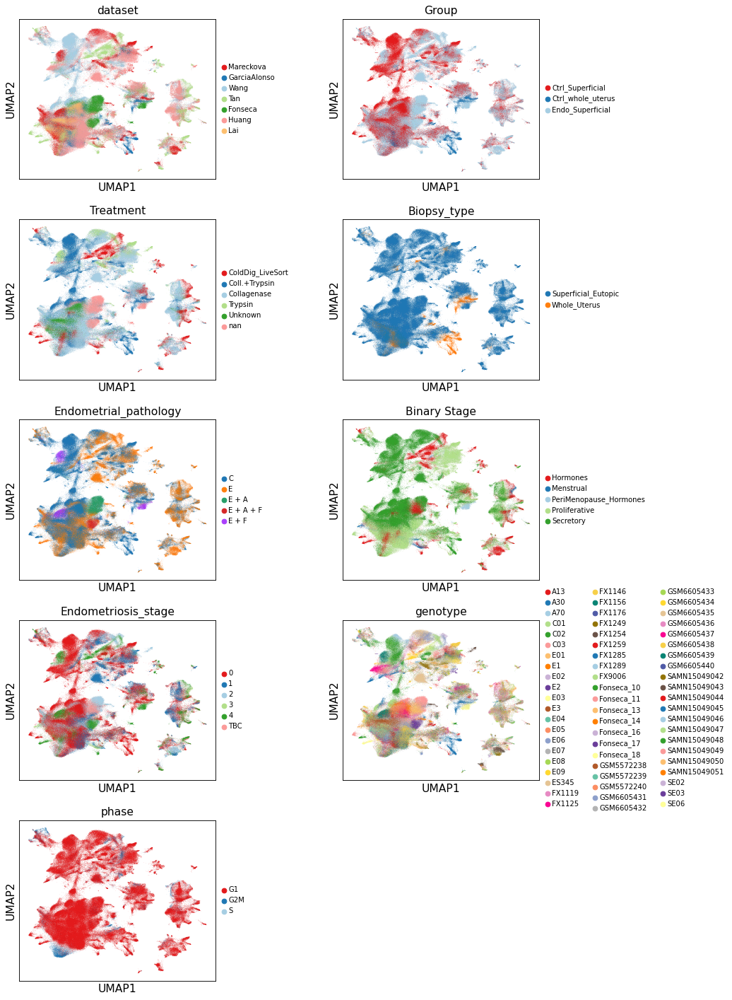

In [6]:
sc.pl.umap(adata, color=['dataset', 'Group', 'Treatment', 'Biopsy_type', 'Endometrial_pathology', 'Binary Stage', 'Endometriosis_stage', 'genotype', 'phase'], wspace=0.5, legend_fontsize=9, ncols=2, save='_allcells_metadata.pdf')

In [7]:
annot_df = pd.read_csv('/nfs/team292/lg18/endometriosis/annotations/cells_endometrium.csv',index_col=0)
annot_df.head()

annot = annot_df['Mareckova_celltype'].to_dict()
adata.obs['Mareckova_celltype'] = adata.obs_names.map(annot)
print(adata.obs['Mareckova_celltype'].value_counts())


annot_df = pd.read_csv('/nfs/team292/lg18/endometriosis/annotations/cells_endometrium_epithelial_CLEAN.csv',index_col=0)
# annot_df.index = [a + '-' + str(b) for a, b in zip(annot_df.index, annot_df.Type.tolist())]
annot_df.head()

annot = annot_df['Mareckova_epi_celltype'].to_dict()
adata.obs['Mareckova_epi_celltype'] = adata.obs_names.map(annot)
print(adata.obs['Mareckova_epi_celltype'].value_counts())


annot_df = pd.read_csv('/nfs/team292/lg18/endometriosis/annotations/cells_endometrium_mesenchymal_CLEAN.csv',index_col=0)
# annot_df.index = [a + '-' + str(b) for a, b in zip(annot_df.index, annot_df.Type.tolist())]
annot_df.head()

annot = annot_df['Mareckova_mesen_celltype'].to_dict()
adata.obs['Mareckova_mesen_celltype'] = adata.obs_names.map(annot)
print(adata.obs['Mareckova_mesen_celltype'].value_counts())

/home/jovyan/my-conda-envs/sc_analysis/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3166: DtypeWarning: Columns (5,8,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,39,40,41,42,46,47,55,56,58,59,60,62,69) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


Mesen_dStromal                 96529
Mesen_eStromal                 79488
Immune_Lymphoid                34456
Epithelial_SOX9                32015
Epithelial_Glandular           27887
Endothelial                    23519
Epithelial_preGlandular        16765
Epithelial_Luminal             14253
Epithelial_Horm                11490
Mesen_ePV                      11325
Immune_Myeloid                 11260
LowQC                           7549
Epithelial_Ciliated             7467
Doublet                         5616
Mesen_mPV                       4618
Mesen_uSMCs                     2995
Epithelial_endocervix_MUC5B     1748
Epithelial_Glands                952
Mesen_FibBasalis                 539
Epithelial_cervix_KRT5           396
Name: Mareckova_celltype, dtype: int64
Hormones                 13287
Glands                   13050
SOX9                     12583
preGlands                11840
Lumen                    10250
Glands_secretory          8610
Ciliated                  5738
Cycl

## Clustering the graph
As Seurat and many others, we use the leiden graph-clustering method (community detection based on optimizing modularity). It has been proposed for single-cell data by Levine et al. (2015).

In [8]:
sc.tl.leiden(adata, resolution=0.5)

running Leiden clustering
    finished: found 28 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:04:40)


... storing 'Mareckova_celltype' as categorical
... storing 'Mareckova_epi_celltype' as categorical
... storing 'Mareckova_mesen_celltype' as categorical


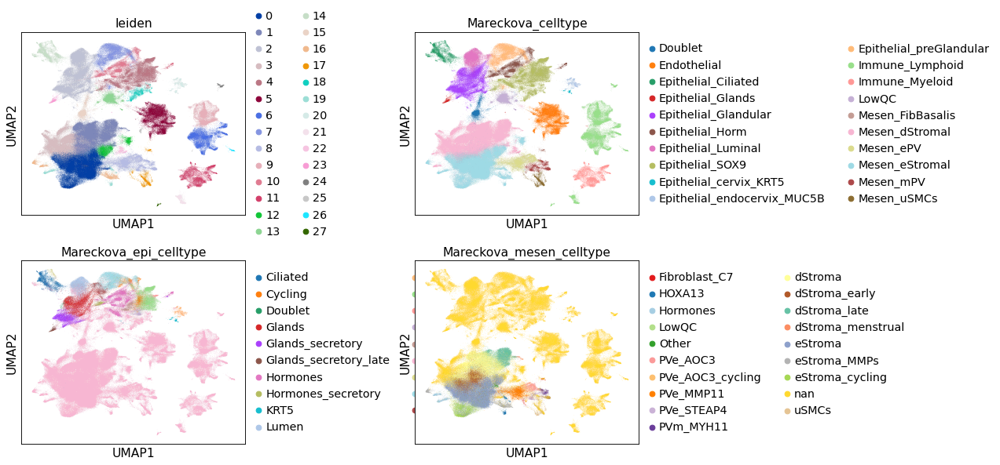

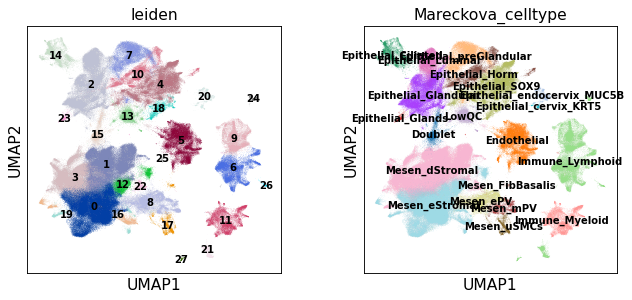

In [9]:
sc.pl.umap(adata, color=['leiden', 'Mareckova_celltype', 'Mareckova_epi_celltype', 'Mareckova_mesen_celltype'], wspace=0.6, ncols=2)
sc.pl.umap(adata, color=['leiden', 'Mareckova_celltype'],legend_loc='on data', legend_fontsize=9)

running Leiden clustering
    finished: found 29 clusters and added
    'leiden_R', the cluster labels (adata.obs, categorical) (0:00:09)


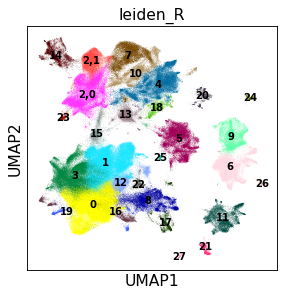

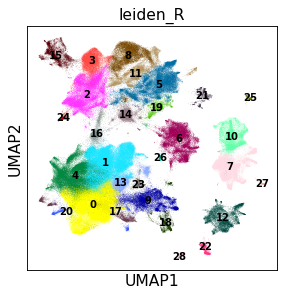

In [10]:
# recluster
sc.tl.leiden(adata, resolution=0.1, restrict_to=('leiden', ['2']))
sc.pl.umap(adata, color='leiden_R',legend_loc='on data', legend_fontsize=9)
adata.obs['leiden_R'].cat.categories = [str(i) for i in range(len(adata.obs['leiden_R'].cat.categories))]
sc.pl.umap(adata, color='leiden_R',legend_loc='on data', legend_fontsize=9)
adata.obs['leiden'] = adata.obs['leiden_R']

running Leiden clustering
    finished: found 30 clusters and added
    'leiden_R', the cluster labels (adata.obs, categorical) (0:00:01)


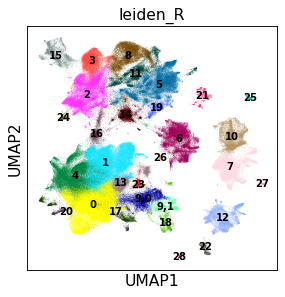

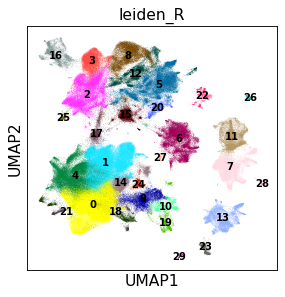

In [11]:
# recluster
sc.tl.leiden(adata, resolution=0.1, restrict_to=('leiden', ['9']))
sc.pl.umap(adata, color='leiden_R',legend_loc='on data', legend_fontsize=9)
adata.obs['leiden_R'].cat.categories = [str(i) for i in range(len(adata.obs['leiden_R'].cat.categories))]
sc.pl.umap(adata, color='leiden_R',legend_loc='on data', legend_fontsize=9)
adata.obs['leiden'] = adata.obs['leiden_R']

running Leiden clustering
    finished: found 32 clusters and added
    'leiden_R', the cluster labels (adata.obs, categorical) (0:00:00)


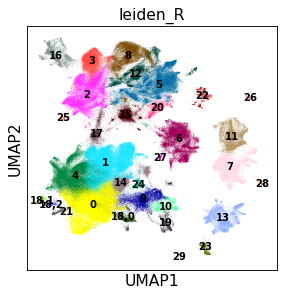

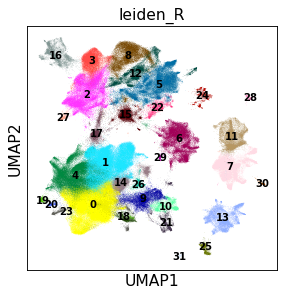

In [12]:
# recluster
sc.tl.leiden(adata, resolution=0.1, restrict_to=('leiden', ['18']))
sc.pl.umap(adata, color='leiden_R',legend_loc='on data', legend_fontsize=9)
adata.obs['leiden_R'].cat.categories = [str(i) for i in range(len(adata.obs['leiden_R'].cat.categories))]
sc.pl.umap(adata, color='leiden_R',legend_loc='on data', legend_fontsize=9)
adata.obs['leiden'] = adata.obs['leiden_R']

running Leiden clustering
    finished: found 33 clusters and added
    'leiden_R', the cluster labels (adata.obs, categorical) (0:00:00)


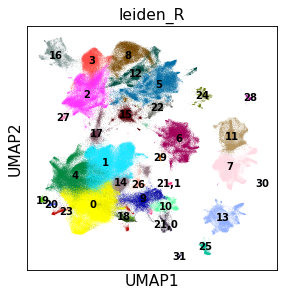

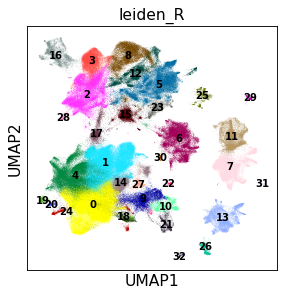

In [13]:
# recluster
sc.tl.leiden(adata, resolution=0.05, restrict_to=('leiden', ['21']))
sc.pl.umap(adata, color='leiden_R',legend_loc='on data', legend_fontsize=9)
adata.obs['leiden_R'].cat.categories = [str(i) for i in range(len(adata.obs['leiden_R'].cat.categories))]
sc.pl.umap(adata, color='leiden_R',legend_loc='on data', legend_fontsize=9)
adata.obs['leiden'] = adata.obs['leiden_R']

running Leiden clustering
    finished: found 34 clusters and added
    'leiden_R', the cluster labels (adata.obs, categorical) (0:00:00)


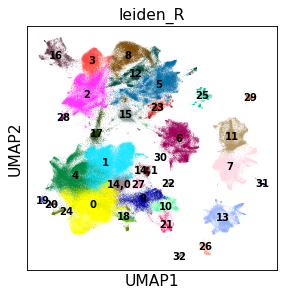

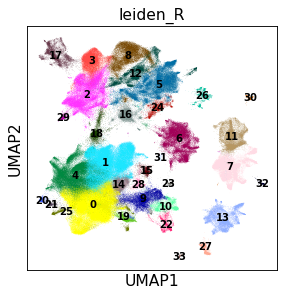

In [14]:
# recluster
sc.tl.leiden(adata, resolution=0.05, restrict_to=('leiden', ['14']))
sc.pl.umap(adata, color='leiden_R',legend_loc='on data', legend_fontsize=9)
adata.obs['leiden_R'].cat.categories = [str(i) for i in range(len(adata.obs['leiden_R'].cat.categories))]
sc.pl.umap(adata, color='leiden_R',legend_loc='on data', legend_fontsize=9)
adata.obs['leiden'] = adata.obs['leiden_R']

running Leiden clustering
    finished: found 35 clusters and added
    'leiden_R', the cluster labels (adata.obs, categorical) (0:00:00)


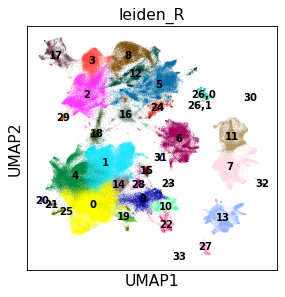

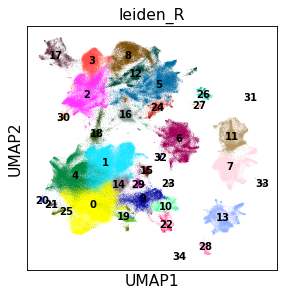

In [15]:
# recluster
sc.tl.leiden(adata, resolution=0.05, restrict_to=('leiden', ['26']))
sc.pl.umap(adata, color='leiden_R',legend_loc='on data', legend_fontsize=9)
adata.obs['leiden_R'].cat.categories = [str(i) for i in range(len(adata.obs['leiden_R'].cat.categories))]
sc.pl.umap(adata, color='leiden_R',legend_loc='on data', legend_fontsize=9)
adata.obs['leiden'] = adata.obs['leiden_R']

# Explore leiden clusters

### Visualize general markers

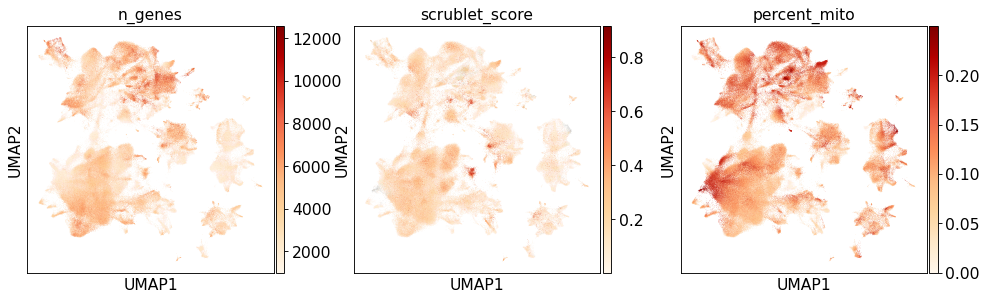

In [16]:
sc.pl.umap(adata, color=['n_genes','scrublet_score', 'percent_mito'], color_map='OrRd')

In [17]:
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
sc.pp.log1p(adata)

normalizing by total count per cell
/home/jovyan/my-conda-envs/sc_analysis/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
    finished (0:00:14): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


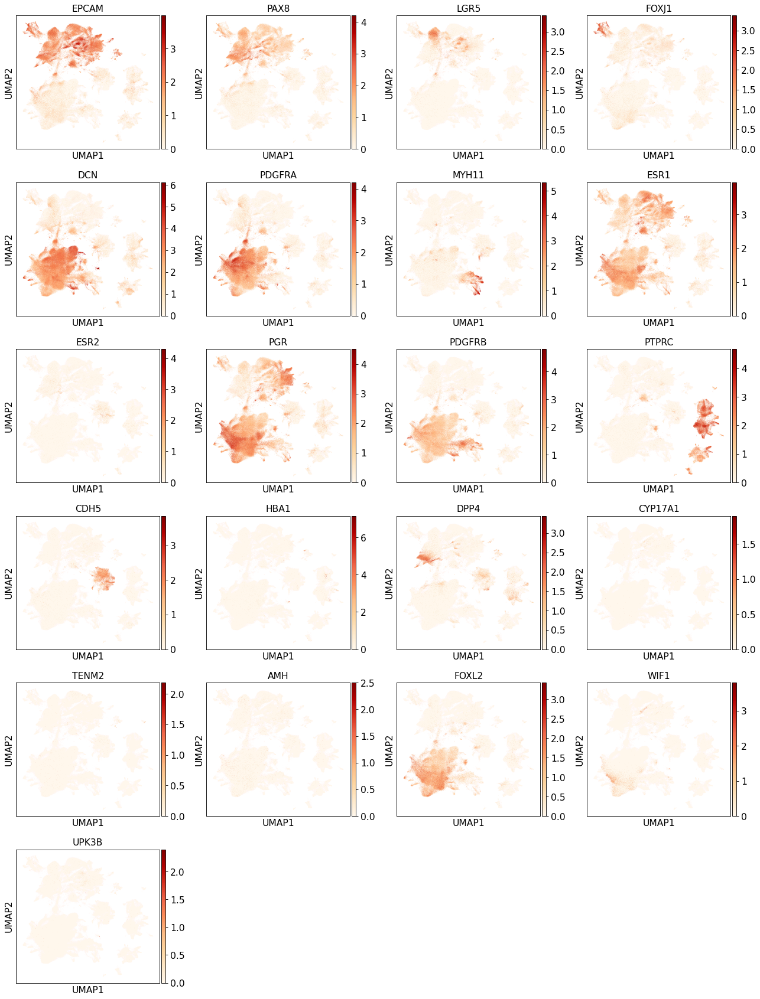

In [18]:
sc.pl.umap(adata, color=["EPCAM", "PAX8", 'LGR5', 'FOXJ1', "DCN", "PDGFRA",  "MYH11", 'ESR1', 'ESR2', 'PGR',
                         "PDGFRB", 'PTPRC', 'CDH5', 'HBA1', 'DPP4',
                        "CYP17A1", "TENM2", "AMH", 'FOXL2', 'WIF1', 'UPK3B'], color_map='OrRd', use_raw=False )

### Check global trends

/home/jovyan/my-conda-envs/sc_analysis/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


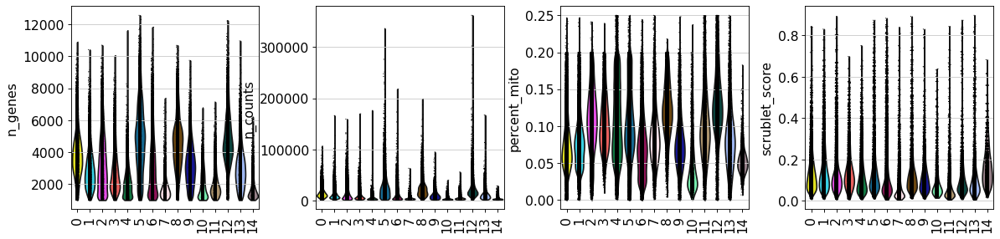

/home/jovyan/my-conda-envs/sc_analysis/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


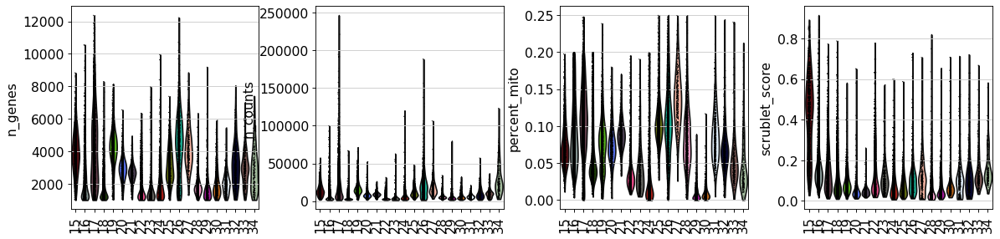

In [19]:
sc.pl.violin(adata[[ float(i) < 15 for i in adata.obs.leiden ]], keys= ['n_genes', 'n_counts', 'percent_mito', 'scrublet_score'], groupby = 'leiden_R', rotation = 90)
sc.pl.violin(adata[[ float(i) >= 15 for i in adata.obs.leiden ]], keys= ['n_genes', 'n_counts', 'percent_mito', 'scrublet_score'], groupby = 'leiden_R', rotation = 90)
# sc.pl.violin(adata, keys= ['percent_mito', 'scrublet_score', 'scrublet_cluster_score'], groupby = 'leiden_R', rotation = 90)

### Check DEGs
Compute a ranking for the highly differential genes in each cluster. Here, we simply rank genes with a t test, which agrees quite well with Seurat.

In [20]:
# # Compute Mann-Withney test with scanpy
# sc.tl.rank_genes_groups(adata, groupby='leiden', use_raw=False) #, method='logreg'
# # Plot
# sc.pl.rank_genes_groups_dotplot(adata, n_genes=20, dendrogram=False, save='_scanpy.pdf', standard_scale = 'var')

### Check metadata

In [21]:
def Barplot(which_var, adata, var='lineage', height=3, color = False):
    plotdata = pd.crosstab(adata.obs[var], adata.obs[which_var], normalize='index') * 100
    if 'category' in plotdata.index.dtype.name:
        plotdata.index.reorder_categories(adata.obs[var].cat.categories[::-1])

    if not color:
        ax1 = plotdata.plot.barh(stacked = True, edgecolor = 'none', zorder = 3, figsize = (6,height), fontsize = 14, grid = False)
    else:
        ax1 = plotdata.plot.barh(stacked = True, edgecolor = 'none', zorder = 3, figsize = (6,height), fontsize = 14, grid = False, color = color)
    ax1.set_title(which_var+' %')
    ax1.set_ylabel(var)
    horiz_offset = 1
    vert_offset = 1.
    ax1 = ax1.legend(bbox_to_anchor = (horiz_offset, vert_offset))
    ax1.figure.savefig(str(sc.settings.figdir)+'/barplot_'+var+'_proportions_'+which_var+'.pdf', bbox_inches='tight',
                       dpi=300, orientation='landscape', format= 'pdf', optimize=True)

/home/jovyan/my-conda-envs/sc_analysis/lib/python3.7/site-packages/ipykernel_launcher.py:16: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "optimize" which is no longer supported as of 3.3 and will become an error two minor releases later
  app.launch_new_instance()
/home/jovyan/my-conda-envs/sc_analysis/lib/python3.7/site-packages/ipykernel_launcher.py:16: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "optimize" which is no longer supported as of 3.3 and will become an error two minor releases later
  app.launch_new_instance()
/home/jovyan/my-conda-envs/sc_analysis/lib/python3.7/site-packages/ipykernel_launcher.py:16: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "optimize" which is no longer supported as of 3.3 and will become an error two minor releases later
  app.launch_new_instance()


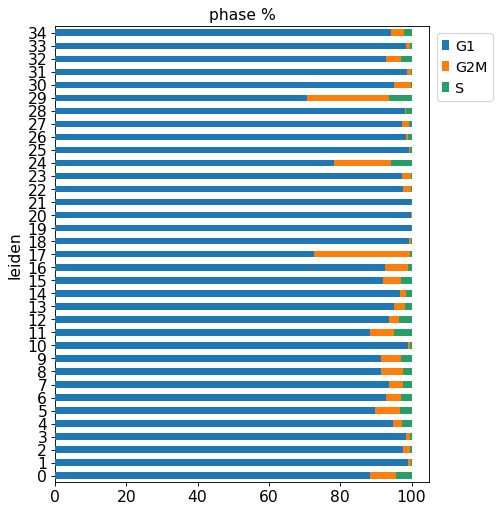

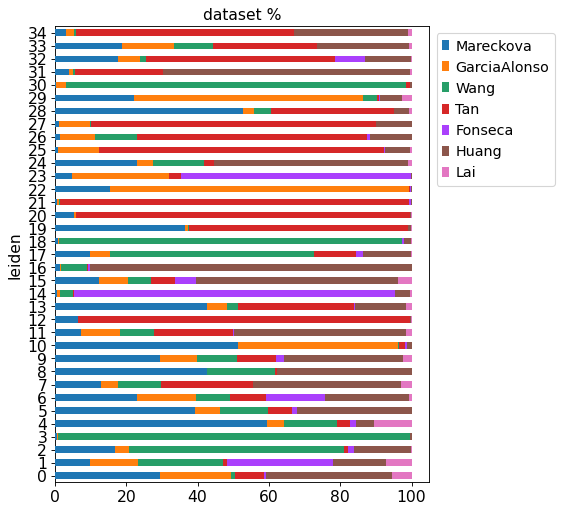

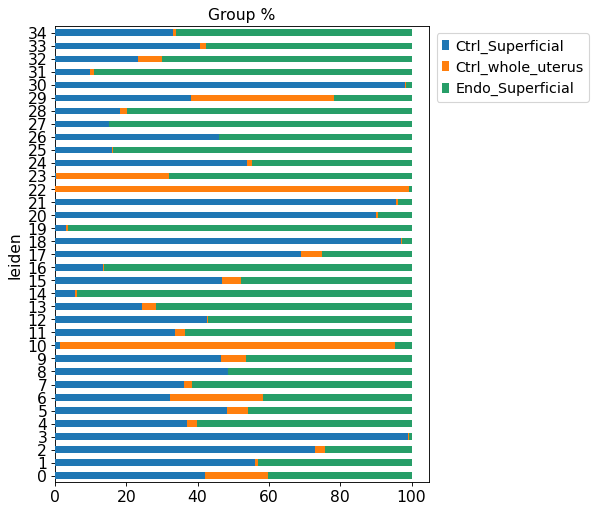

In [22]:
Barplot('phase', adata, var='leiden', height=7.5)
Barplot('dataset', adata, var='leiden', height=7.5)
Barplot('Group', adata, var='leiden', height=7.5)

In [23]:
marker_genes_short = {
    'Epithelial lineage': {'EPCAM', 'PAX8'},    
    'MUC5B+':{"MUC5B",},
    'KRT5/TP63':{'KRT5', 'TP63'},
#     'Mesothelial': {'UPK3B', 'LRRN4'},
    'Mesenchymal lineage': {"PDGFRA", 'OGN'}, # 'DCN', 'LUM'
    'PV lineage':{'MYH11', 'ACTA2', "MCAM"},
    'uSMCs':{'LEFTY2', 'ACTG2', 'ITGA11'},
    'Endothelial': {'PECAM1', 'VWF', 'CDH5'},
    'Immune': {'PTPRC'},
    'Lymphoid': {'CD3D', 'NCAM1' , 'NKG7'},
    'Myeloid': {'CSF1R', 'CD14'},
    'Erythroid': {"HBB", "HBA1"}
}

marker_genes = {
    'Epithelial lineage': {'EPCAM', 'PAX8'},    
#     'fallopian tube':{'DAPL1', 'ERP27', 'PNOC'},
#     'uterus': {'DLX5',  'MSX1'},
#     'cervix': {'TP63', 'KRT13', 'KRT13'}, #(likely only exocervix),
    'MUC5B+':{"MUC5B", "STRA6", "LTF"},
    'KRT5/TP63':{'KRT5', 'TP63', 'SNCG'},
    'Ciliated': {'PIFO', 'FOXJ1', 'TP73'},
#     'pre-Ciliated':{"MUC12", 'CDC20B', 'CCNO'},
#     'Ciliated LGR5+':{"LGR5"},
    'SOX9 proliferative':{'SOX9', 'MMP7', 'IHH'},
    'SOX9 LGR5+':{'LGR5', 'WNT7A'},
    'Lumenal':{'PGR', 'PTGS1', 'IL6'},
    'Glandular': {'SLC18A2', 'C2CD4A', 'SCGB2A2'}, # 'SSP1', 
    'Glandular secretory': {'DPP4', 'PAEP', 'GPX3', 'TSPAN8'}, # 'SSP1', 
    'Mesothelial': {'UPK3B',  'KLK11'}, # 'LRRN4',
#     'EMT': {"ZEB1", 'ZEB2', 'RUNX3', 'RUNX2', 'SNAI1', 'SNAI2'},
    'Mesenchymal lineage': {"PDGFRA", 'OGN'}, # 'DCN', 'LUM'
    'Fibroblast C7': {'C7'},
    'eS':{'MMP1', 'MMP11', 'CRABP2', 'ECM1'},
    'dS':{'DKK1',  'IL15', 'CFD'},
    'PV lineage':{'MYH11', 'ACTA2', "MCAM"},
#     'PV CCL19':{'CCL19', 'HMCN2', 'STEAP4', 'NTRK2', 'FHL5'},
    'PV MYH11':{'RERGL', 'KCNAB1', 'RGS5', 'NTRK2', 'FHL5'},
    'PV STEAP4':{'RGS5', 'GUCY1A2', 'STEAP4', 'AFAP1L2', 'FNDC1'},
    'uSMCs':{'LEFTY2', 'ACTG2', 'ITGA11'},
    'Endothelial': {'PECAM1', 'VWF', 'CDH5'},
    'Immune': {'PTPRC'},
    'Lymphoid': {'CD3D', 'NCAM1' , 'NKG7'},
    'Myeloid': {'CSF1R', 'CD14'},
    'Erythroid': {"HBB", "HBA1"},
#     'ERA':{'GAST', 'C4BPA', 'CP', 'ABCC3', 'PAEP', 'CXCL14'}
#     'Granulosa': {"AMH", "GATA4", 'WNT6', 'GSTA1'},
#     'Theca': {"CYP17A1", "INSL3", 'PTCH2'},
#     'Ovarian stroma':{'GATA4', 'ARX', 'TCF21', 'LHX9', 'OGN'},
#     'cycling': {'CDK1', 'MKI67', 'TOP2A'}
}

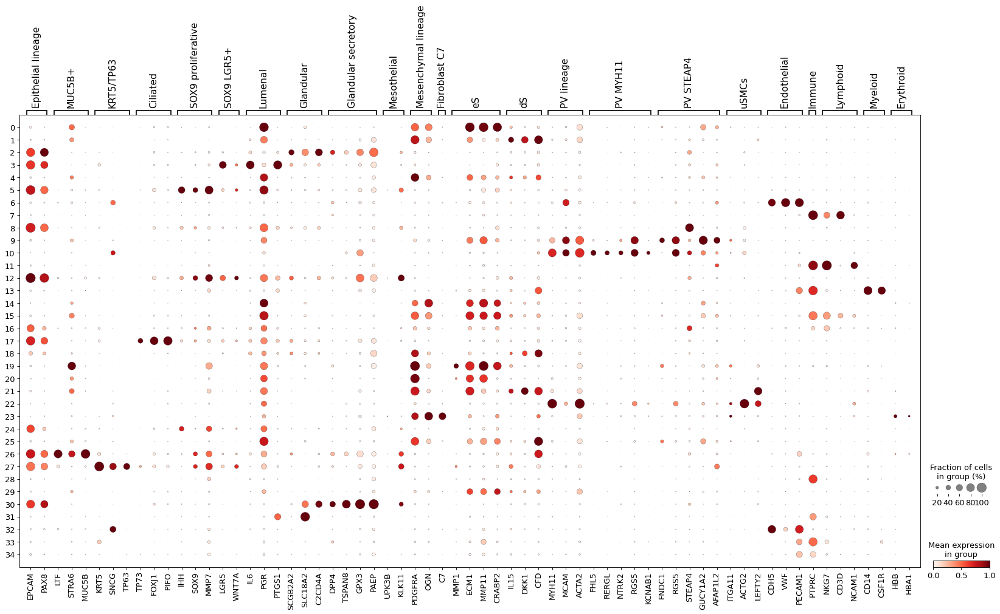

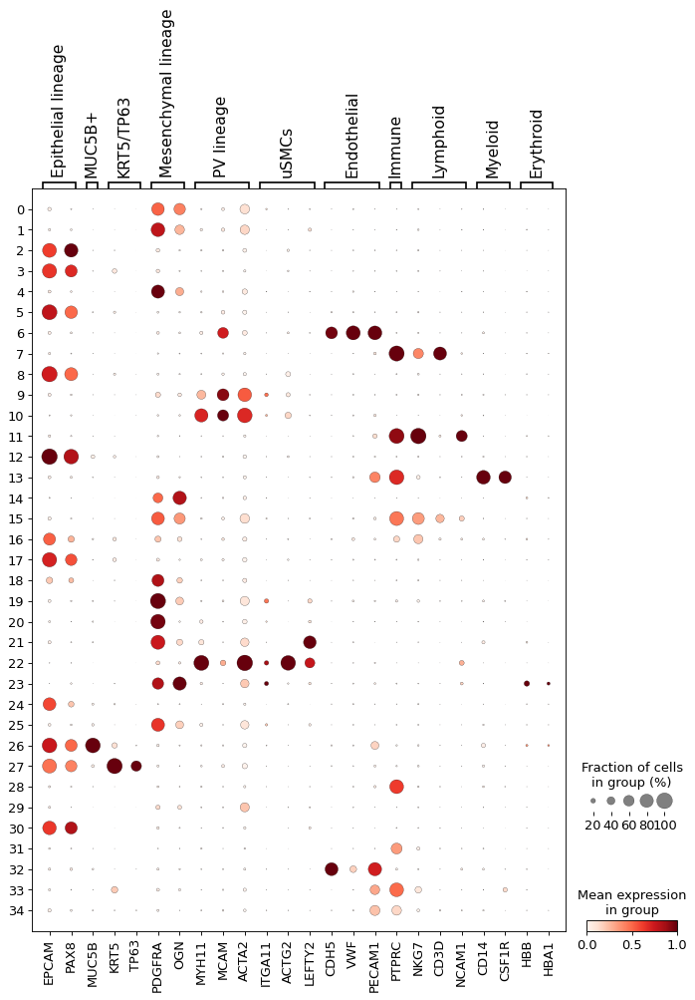

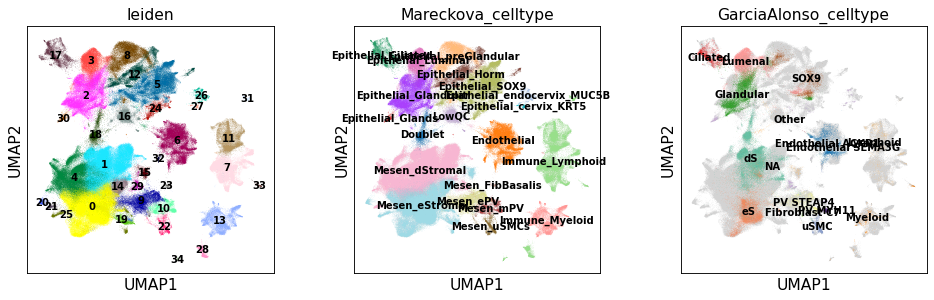

In [24]:
sc.pl.dotplot(adata, marker_genes, groupby='leiden', standard_scale='var', save='MARKERS_leiden.pdf')
sc.pl.dotplot(adata, marker_genes_short, groupby='leiden', standard_scale='var', save='MARKERS-short_leiden.pdf')
sc.pl.umap(adata, color=['leiden', 'Mareckova_celltype', 'GarciaAlonso_celltype'],legend_loc='on data', legend_fontsize=9, save='_leiden.pdf')
# sc.pl.umap(adata, color=['GarciaAlonso_epi_celltype'],legend_loc='on data', legend_fontsize=9)

# Cell's Annotation

... storing 'Mareckova_celltype' as categorical
... storing 'Mareckova_lineage' as categorical


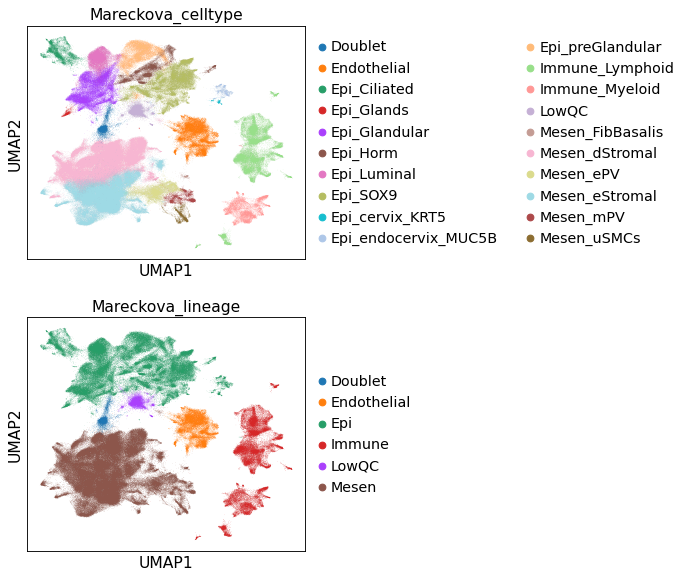

In [44]:
adata.obs['Mareckova_celltype'] = adata.obs['leiden'].tolist()
adata.obs.at[adata.obs['Mareckova_celltype'] == '0', 'Mareckova_celltype'] = 'Mesen_eStromal'
adata.obs.at[adata.obs['Mareckova_celltype'] == '1', 'Mareckova_celltype'] = 'Mesen_dStromal'
adata.obs.at[adata.obs['Mareckova_celltype'] == '2', 'Mareckova_celltype'] = 'Epi_Glandular'
adata.obs.at[adata.obs['Mareckova_celltype'] == '3', 'Mareckova_celltype'] = 'Epi_Luminal'
adata.obs.at[adata.obs['Mareckova_celltype'] == '4', 'Mareckova_celltype'] = 'Mesen_dStromal'
adata.obs.at[adata.obs['Mareckova_celltype'] == '5', 'Mareckova_celltype'] = 'Epi_SOX9'
adata.obs.at[adata.obs['Mareckova_celltype'] == '6', 'Mareckova_celltype'] = 'Endothelial'
adata.obs.at[adata.obs['Mareckova_celltype'] == '7', 'Mareckova_celltype'] = 'Immune_Lymphoid'
adata.obs.at[adata.obs['Mareckova_celltype'] == '8', 'Mareckova_celltype'] = 'Epi_preGlandular'
adata.obs.at[adata.obs['Mareckova_celltype'] == '9', 'Mareckova_celltype'] = 'Mesen_ePV'
adata.obs.at[adata.obs['Mareckova_celltype'] == '10', 'Mareckova_celltype'] = 'Mesen_mPV'
adata.obs.at[adata.obs['Mareckova_celltype'] == '11', 'Mareckova_celltype'] = 'Immune_Lymphoid'
adata.obs.at[adata.obs['Mareckova_celltype'] == '12', 'Mareckova_celltype'] = 'Epi_Horm'
adata.obs.at[adata.obs['Mareckova_celltype'] == '13', 'Mareckova_celltype'] = 'Immune_Myeloid'
adata.obs.at[adata.obs['Mareckova_celltype'] == '14', 'Mareckova_celltype'] = 'Mesen_eStromal'
adata.obs.at[adata.obs['Mareckova_celltype'] == '15', 'Mareckova_celltype'] = 'Mesen_eStromal'
adata.obs.at[adata.obs['Mareckova_celltype'] == '16', 'Mareckova_celltype'] = 'LowQC'
adata.obs.at[adata.obs['Mareckova_celltype'] == '17', 'Mareckova_celltype'] = 'Epi_Ciliated'
adata.obs.at[adata.obs['Mareckova_celltype'] == '18', 'Mareckova_celltype'] = 'Doublet'
adata.obs.at[adata.obs['Mareckova_celltype'] == '19', 'Mareckova_celltype'] = 'Mesen_eStromal'
adata.obs.at[adata.obs['Mareckova_celltype'] == '20', 'Mareckova_celltype'] = 'Mesen_eStromal'
adata.obs.at[adata.obs['Mareckova_celltype'] == '21', 'Mareckova_celltype'] = 'Mesen_dStromal'
adata.obs.at[adata.obs['Mareckova_celltype'] == '22', 'Mareckova_celltype'] = 'Mesen_uSMCs'
adata.obs.at[adata.obs['Mareckova_celltype'] == '23', 'Mareckova_celltype'] = 'Mesen_FibBasalis'
adata.obs.at[adata.obs['Mareckova_celltype'] == '24', 'Mareckova_celltype'] = 'Epi_SOX9'
adata.obs.at[adata.obs['Mareckova_celltype'] == '25', 'Mareckova_celltype'] = 'Mesen_eStromal'
adata.obs.at[adata.obs['Mareckova_celltype'] == '26', 'Mareckova_celltype'] = 'Epi_endocervix_MUC5B'
adata.obs.at[adata.obs['Mareckova_celltype'] == '27', 'Mareckova_celltype'] = 'Epi_cervix_KRT5'
adata.obs.at[adata.obs['Mareckova_celltype'] == '28', 'Mareckova_celltype'] = 'Immune_Lymphoid'
adata.obs.at[adata.obs['Mareckova_celltype'] == '29', 'Mareckova_celltype'] = 'Mesen_dStromal'
adata.obs.at[adata.obs['Mareckova_celltype'] == '30', 'Mareckova_celltype'] = 'Epi_Glands'
adata.obs.at[adata.obs['Mareckova_celltype'] == '31', 'Mareckova_celltype'] = 'Immune_Lymphoid'
adata.obs.at[adata.obs['Mareckova_celltype'] == '32', 'Mareckova_celltype'] = 'Endothelial'
adata.obs.at[adata.obs['Mareckova_celltype'] == '33', 'Mareckova_celltype'] = 'Immune_Lymphoid'
adata.obs.at[adata.obs['Mareckova_celltype'] == '34', 'Mareckova_celltype'] = 'Immune_Lymphoid'


set(adata.obs['Mareckova_celltype'])
adata.obs['Mareckova_lineage'] = [str(i).split('_', 1)[0] for i in adata.obs['Mareckova_celltype'] ]

sc.pl.umap(adata, color=['Mareckova_celltype', 'Mareckova_lineage'], ncols=1)
# adata.obs['Mareckova_celltype'].cat.reorder_categories(['Epithelial', 'Epi_MUC5B', 'Epi_Glands', 'Epi_Ciliated', ''Epi_TP63+KRT5+'',
#                                                         'Mesothelial', 
#                                                         'Mesenchymal_eS', 'Mesenchymal_dS', 'Mesenchymal-C7', 
#                                                         'PV_STEAP4', 'PV_MYH11', 'uSMCs',
#                                                         'Endothelial', 'Endothelial_LEC', 'Myeloid', 'Lymphoid',
#                                                         'EcO_Mesenchymal',
#                                                         'EcO_Mesenchymal-COL10A1'
#                                                         'EcO_Granulosa', 'EcO_Theca',
#                                                         'LowQC', 'Doublet'], inplace=True)

# sc.pl.umap(adata, color=['Mareckova_celltype'])

... storing 'leiden_celltype' as categorical


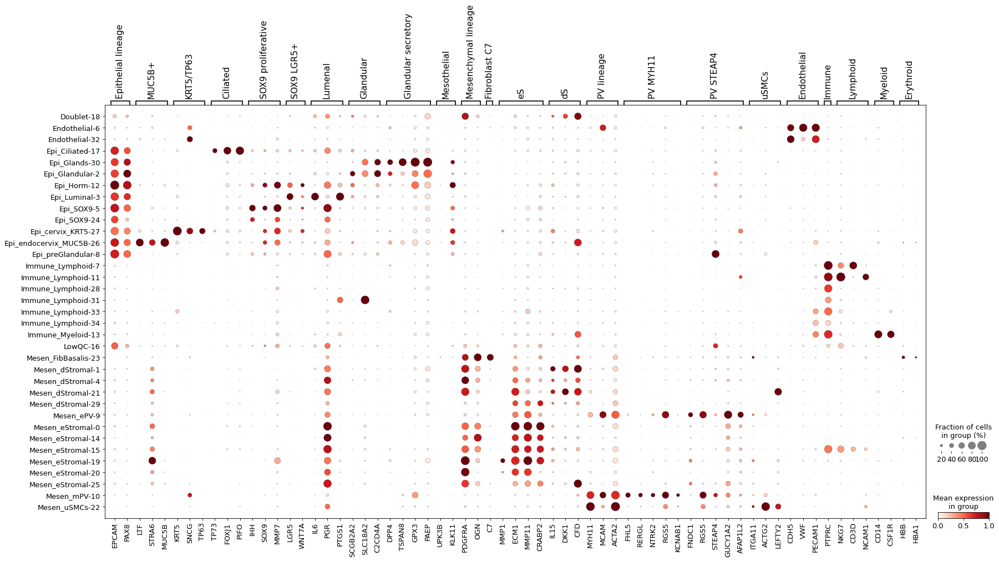

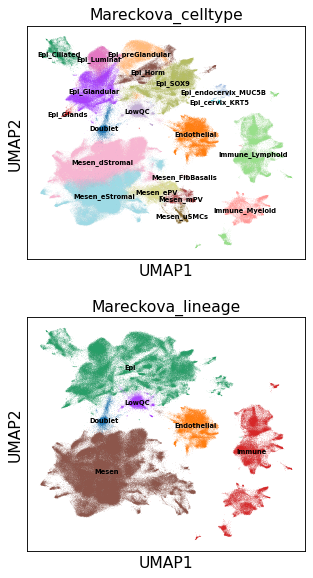

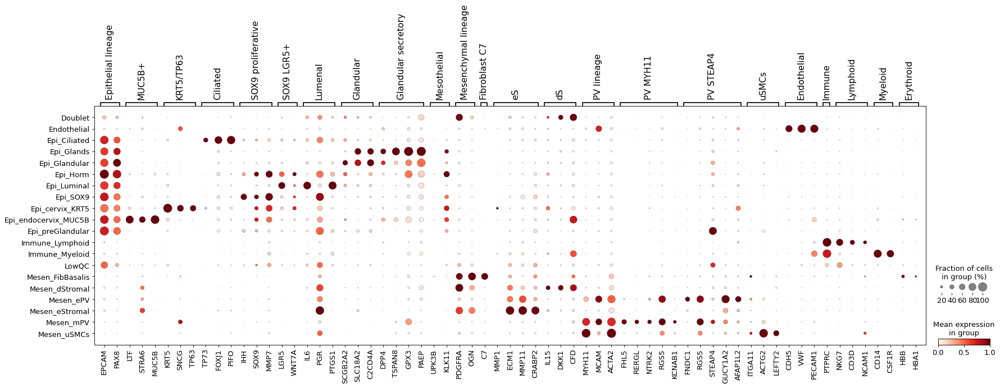

In [45]:
adata.obs['leiden_celltype'] =  [b + '-' + a  for a, b in zip(adata.obs['leiden'], adata.obs['Mareckova_celltype'])]
sc.pl.dotplot(adata, marker_genes, groupby='leiden_celltype', standard_scale='var')

sc.pl.umap(adata, color=['Mareckova_celltype', 'Mareckova_lineage'], legend_loc='on data', legend_fontsize=6, ncols=1, save='_celltype.pdf')
sc.pl.dotplot(adata, marker_genes, groupby='Mareckova_celltype', standard_scale='var', save='MARKERS_celltype.pdf')

In [46]:
# adata.write('x.h5ad')
pd.DataFrame(adata.obs).to_csv('/nfs/team292/lg18/endometriosis/annotations/cells_endometrium.csv')

In [47]:
genotype_dataset = [a + '-' + b + '-' + c  for a, b, c in zip(adata.obs['dataset'], adata.obs['Stage'],adata.obs['genotype'])]
adata.obs['genotype_dataset'] = genotype_dataset

Group_stage = [a + '-' + b  for a, b in zip(adata.obs['Stage'], adata.obs['Group'])]
adata.obs['Group_stage'] = Group_stage

/home/jovyan/my-conda-envs/sc_analysis/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
/home/jovyan/my-conda-envs/sc_analysis/lib/python3.7/site-packages/ipykernel_launcher.py:16: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "optimize" which is no longer supported as of 3.3 and will become an error two minor releases later
  app.launch_new_instance()
/home/jovyan/my-conda-envs/sc_analysis/lib/python3.7/site-packages/ipykernel_launcher.py:16: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "optimize" which is no longer supported as of 3.3 and will become an error two minor releases later
  app.launch_new_instance()
/home/jovyan/my-conda-envs/sc_analysis/lib/python3.7/site-packages/ipykernel_launcher.py:16: MatplotlibDeprecationWarning: savefig() g

,counts,freqs
categories,,
Mareckova,94173,0.249331
GarciaAlonso,41043,0.108665
Wang,71673,0.189761
Tan,44137,0.116857
Fonseca,29738,0.078734
Huang,83659,0.221495
Lai,13279,0.035157


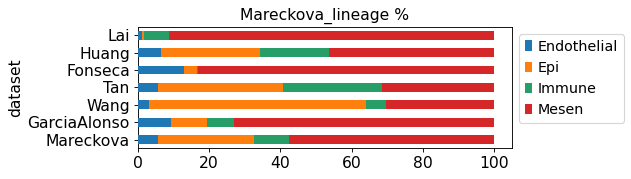

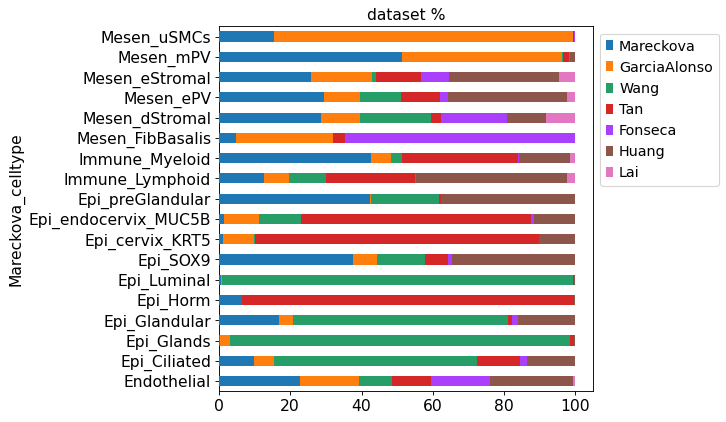

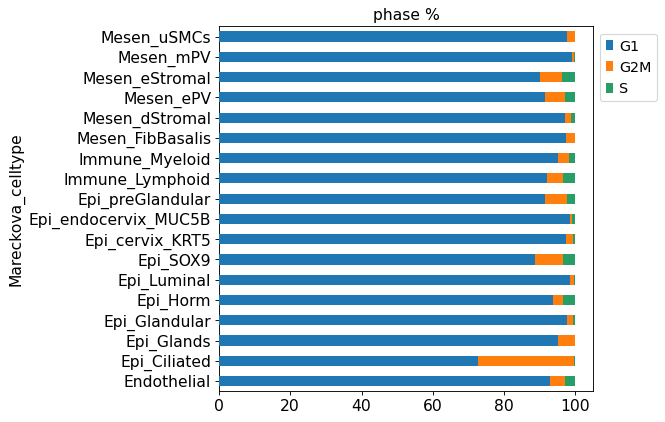

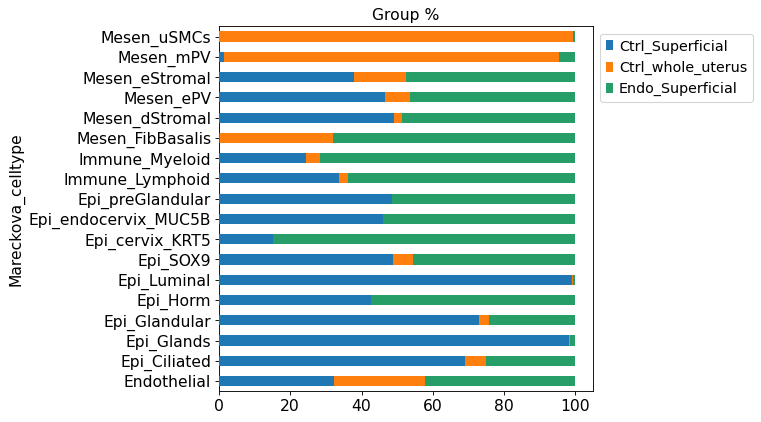

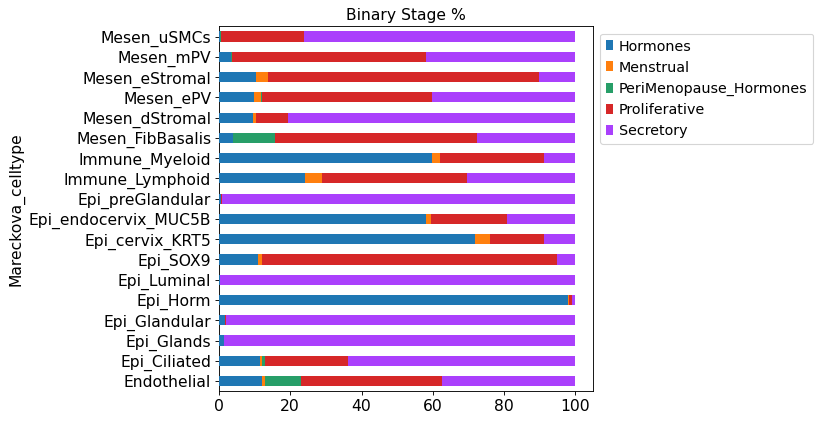

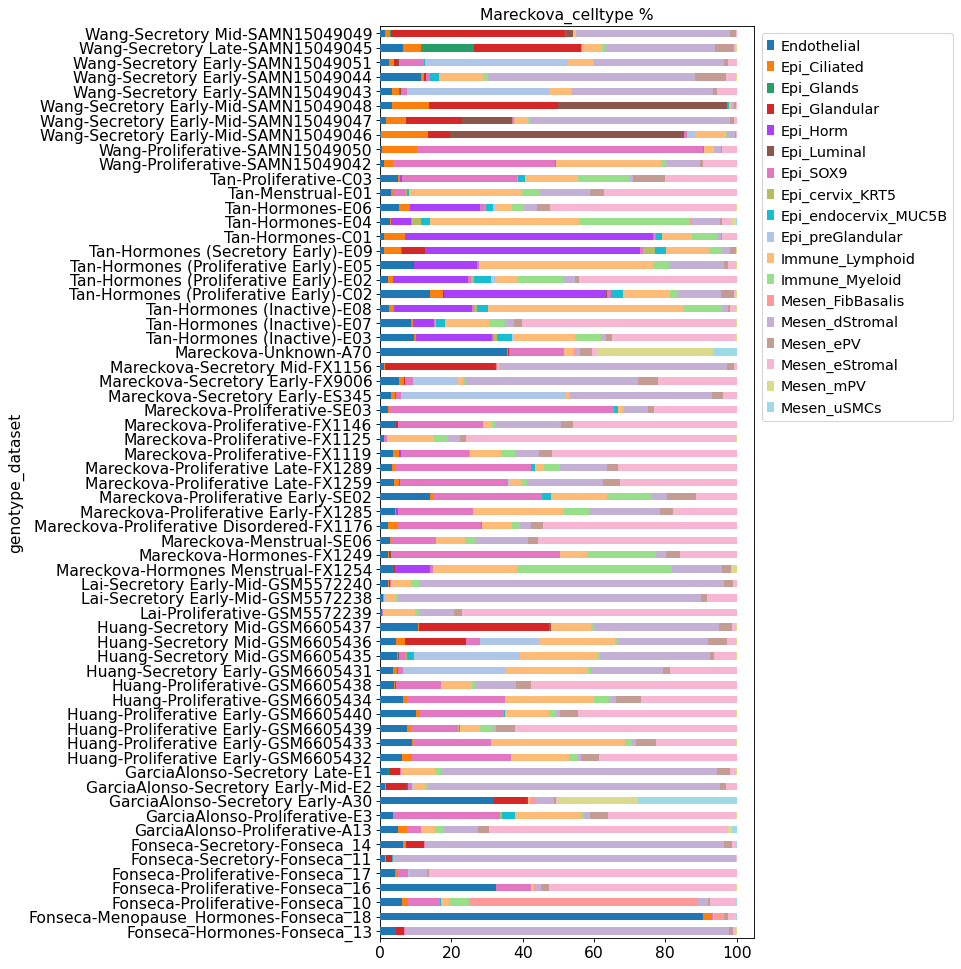

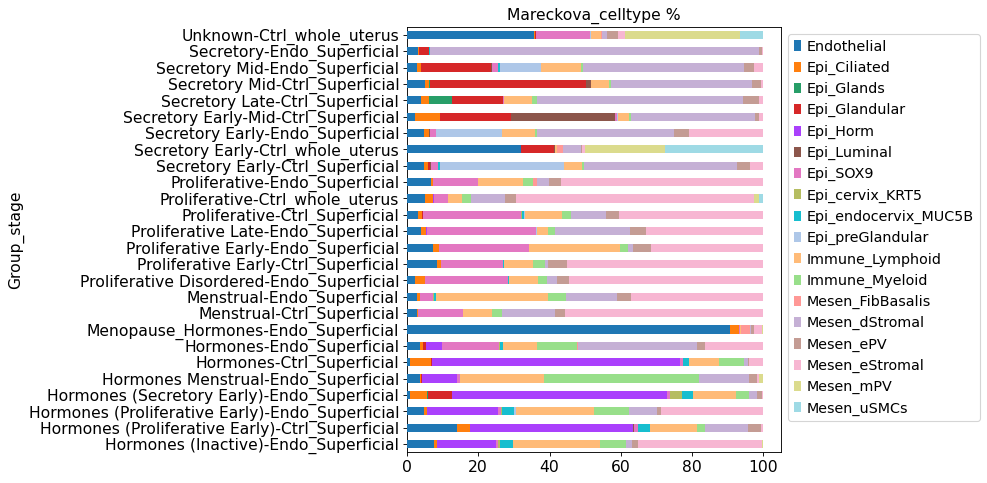

In [48]:
X = adata[[i not in ['Doublet', 'LowQC'] for i in adata.obs.Mareckova_lineage ]]
Barplot('Mareckova_lineage', X, var='dataset', height=2)
Barplot('dataset', X, var='Mareckova_celltype', height=6)
Barplot('phase', X, var='Mareckova_celltype', height=6)
Barplot('Group', X, var='Mareckova_celltype', height=6)
Barplot('Binary Stage', X, var='Mareckova_celltype', height=6)
Barplot('Mareckova_celltype', X, var='genotype_dataset', height=15)
Barplot('Mareckova_celltype', X, var='Group_stage', height=7)

X.obs['dataset'].values.describe()

In [49]:
adata.obs['genotype'].values.describe()

,counts,freqs
categories,,
A13,17135,0.043838
A30,8244,0.021092
A70,7067,0.018080
C01,2957,0.007565
C02,6032,0.015432
...,...,...
SAMN15049050,2679,0.006854
SAMN15049051,3434,0.008786
SE02,212,0.000542


In [50]:
adata.obs['Mareckova_celltype'].values.describe()

,counts,freqs
categories,,
Doublet,5616,0.014368
Endothelial,23519,0.060171
Epi_Ciliated,7467,0.019104
Epi_Glands,952,0.002436
Epi_Glandular,27887,0.071347
Epi_Horm,11490,0.029396
Epi_Luminal,14253,0.036465
Epi_SOX9,32015,0.081908
Epi_cervix_KRT5,396,0.001013


# TF-IDF

In [51]:
# Downsample the dataset to speed up TF-IDF
import anndata
adataDown = adata[[ i in ["G1"] for i in adata.obs.phase ]]
sc.pp.filter_cells(adataDown, min_genes=2000)
sc.pp.filter_genes(adataDown, min_cells=5)
# print(adataDown.obs['leiden'].value_counts())

### Dowsample the whole dataset UN-EVEN
# adataDown = sc.pp.subsample(XX, fraction=0.25, random_state=0, copy=True) 


### Downsample to the smallest pop size
target_cells = 50

adataDown.obs['cell'] = adataDown.obs.index
adatas = [adataDown[adataDown.obs['leiden'].isin([cl])] for cl in adataDown.obs['leiden'].cat.categories]
# adatas = [adataDown[ adataDown.obs['leiden']==cl ] for cl in adataDown.obs['leiden'].cat.categories]

for dat in adatas:
    if dat.n_obs > target_cells:
        sc.pp.subsample(dat, n_obs=target_cells, random_state=0)
adata_downsampled = adatas[0].concatenate(*adatas[1:])
adataDown = adataDown[[ i in adata_downsampled.obs.cell.tolist() for i in adataDown.obs['cell'] ]]

sc.pp.filter_genes(adataDown, min_cells=20)
print(adataDown.obs['leiden'].value_counts())

del adata_downsampled
del adatas

/home/jovyan/my-conda-envs/sc_analysis/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
filtered out 123018 cells that have less than 2000 genes expressed
Trying to set attribute `.obs` of view, copying.
filtered out 3095 genes that are detected in less than 20 cells
Trying to set attribute `.var` of view, copying.


0     50
26    50
20    50
21    50
22    50
23    50
24    50
25    50
27    50
18    50
28    50
29    50
30    50
31    50
32    50
33    50
19    50
17    50
1     50
8     50
2     50
3     50
4     50
5     50
6     50
7     50
9     50
16    50
10    50
11    50
12    50
13    50
14    50
15    50
34    50
Name: leiden, dtype: int64


In [52]:
import rpy2.rinterface_lib.callbacks
import logging
# Itoliste R warning messages
#Note: this can be commented out to get more verbose R output
rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)
import anndata2ri
anndata2ri.activate()
%load_ext rpy2.ipython


The rpy2.ipython extension is already loaded. To reload it, use:
  %reload_ext rpy2.ipython


In [53]:
# This is just to allow moving adata to R without errors
adataDown.X = adataDown.X.toarray()

idx = ['n_genes', 'sample',  'percent_mito', 'n_counts', 'batch', 'S_score', 'G2M_score', 'phase', 
       'scrublet_score', 'scrublet_cluster_score', 'zscore', 'bh_pval', 'bonf_pval', 'is_doublet']
for i in idx:
    del adataDown.obs[i]
    
adataDown.obs['leiden'] = adataDown.obs['leiden'].astype(str)

del adataDown.obsm['X_scVI']
del adataDown.obsm['X_umap']
del adataDown.obsp['connectivities']
del adataDown.obsp['distances']
del adataDown.uns

In [54]:
%%R -i adataDown
adataDown

class: SingleCellExperiment 
dim: 14641 1750 
metadata(0):
assays(1): X
rownames(14641): A1BG A2M ... ZYX ZZEF1
rowData names(220): gene_ids.0.Fonseca feature_types.0.Fonseca ...
  highly_variable_nbatches n_cells
colnames(1750): HCA_A_RepT_RNA13247830_AAACGGGTCACTCCTG-Mareckova
  HCA_A_RepT_RNA13247830_AAAGCAACAAACGTGG-Mareckova ...
  GSM5572240_TTGGGCGAGAACCGCA-Lai GSM5572240_TTGTGTTGTGCCTAAT-Lai
colData names(63): library StudyName ... Group_stage cell
reducedDimNames(0):
altExpNames(0):


### By Leiden

In [55]:
%%R -o df_tfIDF -o topgenes_tfIDF

library(Seurat)
library(SoupX)
library(dplyr)
seurat_andata = as.Seurat(adataDown, counts = "X", data = "X")
Idents(seurat_andata) = seurat_andata$leiden_celltype


df_tfIDF = quickMarkers(toc = seurat_andata@assays$RNA@counts, clusters = Idents(seurat_andata), N = 500)

df_tfIDF$cluster = factor(df_tfIDF$cluster, levels = unique(sort(df_tfIDF$cluster))  )
topgenes_tfIDF = subset(df_tfIDF, qval <= 0.05) %>%
  group_by(cluster) %>%
  group_map(~ head(.x, 20L)$gene)
names(topgenes_tfIDF) = paste('cl', levels(df_tfIDF$cluster) )

In [56]:
df_tfIDF.to_csv('TFIDF_leiden.tsv', index=False, sep='\t')

... storing 'genotype_dataset' as categorical
... storing 'Group_stage' as categorical


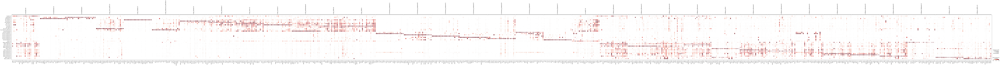

In [57]:
topgenes_tfIDF = dict(zip(topgenes_tfIDF.names, map(list,list(topgenes_tfIDF)))) # this is to convert into a dictionary for plotting
for i in topgenes_tfIDF.keys():
    topgenes_tfIDF[i] = [value for value in topgenes_tfIDF[i] if value in adata.var_names] 
    
sc.pl.dotplot(adata, topgenes_tfIDF, groupby='leiden_celltype', standard_scale = 'var', save='TFIDF_leiden.pdf')#topgenes_tfIDF

## By celltype

In [58]:
%%R -o df_tfIDF -o topgenes_tfIDF

library(Seurat)
library(SoupX)
library(dplyr)
seurat_andata = as.Seurat(adataDown, counts = "X", data = "X")
Idents(seurat_andata) = seurat_andata$Mareckova_celltype


df_tfIDF = quickMarkers(toc = seurat_andata@assays$RNA@counts, clusters = Idents(seurat_andata), N = 500)

df_tfIDF$cluster = factor(df_tfIDF$cluster, levels = unique(df_tfIDF$cluster)  )
topgenes_tfIDF = subset(df_tfIDF, qval <= 0.05) %>%
  group_by(cluster) %>%
  group_map(~ head(.x, 20L)$gene)
names(topgenes_tfIDF) = unique(df_tfIDF$cluster)

In [59]:
df_tfIDF.to_csv('TFIDF_allcells_Mareckova_celltype.tsv', index=False, sep='\t')

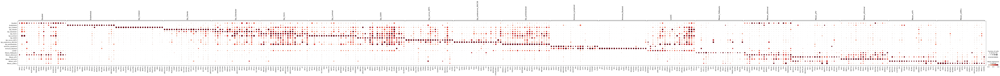

In [60]:
topgenes_tfIDF = dict(zip(topgenes_tfIDF.names, map(list,list(topgenes_tfIDF)))) # this is to convert into a dictionary for plotting
for i in topgenes_tfIDF.keys():
    topgenes_tfIDF[i] = [value for value in topgenes_tfIDF[i] if value in adata.var_names] 
    
sc.pl.dotplot(adata, topgenes_tfIDF, groupby='Mareckova_celltype', standard_scale = 'var', save='TFIDF_celltype.pdf')#topgenes_tfIDF

In [61]:
adata.write('/nfs/team292/lg18/endometriosis/clustered_objects/cells.h5ad')

In [62]:
pd.crosstab(adata.obs.genotype_dataset, adata.obs.Mareckova_celltype )

Mareckova_celltype,Doublet,Endothelial,Epi_Ciliated,Epi_Glands,Epi_Glandular,Epi_Horm,Epi_Luminal,Epi_SOX9,Epi_cervix_KRT5,Epi_endocervix_MUC5B,Epi_preGlandular,Immune_Lymphoid,Immune_Myeloid,LowQC,Mesen_FibBasalis,Mesen_dStromal,Mesen_ePV,Mesen_eStromal,Mesen_mPV,Mesen_uSMCs
genotype_dataset,,,,,,,,,,,,,,,,,,,,
Fonseca-Hormones-Fonseca_13,2,306,9,0,150,3,0,5,0,0,0,3,0,2,3,6255,68,67,2,1
Fonseca-Menopause_Hormones-Fonseca_18,1,2353,64,0,0,0,0,13,0,0,0,3,0,0,64,8,28,52,11,3
Fonseca-Proliferative-Fonseca_10,0,25,7,0,0,1,0,37,0,1,0,9,23,0,267,12,2,29,0,2
Fonseca-Proliferative-Fonseca_16,4,554,2,0,0,0,0,166,0,0,2,11,0,23,10,25,39,890,6,0
Fonseca-Proliferative-Fonseca_17,9,256,34,0,3,0,1,178,0,0,3,2,2,13,0,298,30,5113,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Wang-Secretory Early-SAMN15049043,4,144,82,0,3,2,22,70,0,0,1679,267,10,19,0,1664,49,237,0,0
Wang-Secretory Early-SAMN15049044,0,528,39,1,31,1,4,41,0,119,13,567,61,6,0,2695,409,132,5,0
Wang-Secretory Early-SAMN15049051,10,89,43,0,41,0,6,244,0,5,1364,249,7,8,0,1243,41,83,1,0
